# 📝 Time Series - Machine Temperature

## 🌟 Highlights 
From this project "Time Series - Machine Temperature", the highlights with isolation forest are addressed as:
  - Split data into 60/20/20 for training/validation/test
  - Fine tune model parameters with training and validation set to prevent data leakage
  - Chosen parameters of isolation forest: contamination=0.12 and n_estimators=100 based on f1 score of positive and negative
  - Trained model with training and validation set can achieve f1 score of 0.9 in test set.
  - Consistency condition check is added to prevent false alarm by detecting continuous anomalies: Improve to f1 score of 0.92 for test set  
    Note: Improve to f1 score of 0.59 from 0.54 for whole data set
 
## 🏭 Build Flow
- Import libraries
- Data cleaning & EDA
- Anomaly detection - Isolation forest

### Import Libraries

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

from itertools import product

from scipy.stats import boxcox
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.arima.model import ARIMA

from sklearn.ensemble import IsolationForest
from sklearn.metrics import classification_report, confusion_matrix

### Data cleaning & EDA
- Data collection frequency
- Data type correction
- Separate datetime for convinient filter
- Missing data
- Add label data into dataframe
- Visualization

In [2]:
file = r'D:\coding\2026\time_series_analysis\realKnownCause\realKnownCause\machine_temperature_system_failure.csv'

df = pd.read_csv(file)
df.head(10)

,timestamp,value
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836
5,2013-12-02 21:40:00,78.710418
6,2013-12-02 21:45:00,80.269784
7,2013-12-02 21:50:00,80.272828
8,2013-12-02 21:55:00,80.353425
9,2013-12-02 22:00:00,79.486523


Data is collected every 5 mins

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  22695 non-null  object 
 1   value      22695 non-null  float64
dtypes: float64(1), object(1)
memory usage: 354.7+ KB


timestamp column is not datetime data type 

In [4]:
# Change timestamp to datetime
df['time'] = pd.to_datetime(df['timestamp'])
df.head()

,timestamp,value,time
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00


In [5]:
# Separate year, month, date, hour, min out to columns (convenient for filter purpose)
df['year'] = df['time'].apply(lambda x: x.year)
df['month'] = df['time'].apply(lambda x: x.month)
df['day'] = df['time'].apply(lambda x: x.day)
df['hour'] = df['time'].apply(lambda x: x.hour)
df['minute'] = df['time'].apply(lambda x: x.minute)
df

,timestamp,value,time,year,month,day,hour,minute
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35
...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,2014,2,19,15,5
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,2014,2,19,15,10
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,2014,2,19,15,15
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,2014,2,19,15,20


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  22695 non-null  object        
 1   value      22695 non-null  float64       
 2   time       22695 non-null  datetime64[ns]
 3   year       22695 non-null  int64         
 4   month      22695 non-null  int64         
 5   day        22695 non-null  int64         
 6   hour       22695 non-null  int64         
 7   minute     22695 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 1.4+ MB


In [7]:
print(df.shape)
df['value'].isnull().value_counts()

(22695, 8)


False    22695
Name: value, dtype: int64

No missing data

#### Add label data into dataframe
- Add label (find [here](https://github.com/numenta/NAB/blob/master/labels/combined_labels.json))
- Add label window (find [here](https://github.com/numenta/NAB/blob/master/labels/combined_windows.json))

In [8]:
anomaly_label = [
        "2013-12-11 06:00:00",
        "2013-12-16 17:25:00",
        "2014-01-28 13:55:00",
        "2014-02-08 14:30:00"
]

anomaly_window = [
        [
            "2013-12-10 06:25:00.000000",
            "2013-12-12 05:35:00.000000"
        ],
        [
            "2013-12-15 17:50:00.000000",
            "2013-12-17 17:00:00.000000"
        ],
        [
            "2014-01-27 14:20:00.000000",
            "2014-01-29 13:30:00.000000"
        ],
        [
            "2014-02-07 14:55:00.000000",
            "2014-02-09 14:05:00.000000"
        ]
    ]

In [9]:
df['anomaly_point'] = 0
df['anomaly_window'] = 0

'''
anomaly_point:
    1: anomaly; 0: normal
anomaly_window:
    1: anomaly_window; 0: normal
'''

for i in anomaly_label:
    df.loc[df['time'] == i, 'anomaly_point'] = 1

for start, end in anomaly_window:
    df.loc[((df['time'] >= start) & (df['time'] <= end)), 'anomaly_window'] = 1

df.head()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0


#### Visualization
- Visualize anomaly points
- Visualize anamaly window

In [10]:
df_anomaly_points = df[df['anomaly_point'] == 1]
df_anomaly_points
df_anomaly_windows = df[df['anomaly_window'] == 1]
df_anomaly_windows

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window
2126,2013-12-10 06:25:00,53.886196,2013-12-10 06:25:00,2013,12,10,6,25,0,1
2127,2013-12-10 06:30:00,54.113727,2013-12-10 06:30:00,2013,12,10,6,30,0,1
2128,2013-12-10 06:35:00,53.514577,2013-12-10 06:35:00,2013,12,10,6,35,0,1
2129,2013-12-10 06:40:00,54.920342,2013-12-10 06:40:00,2013,12,10,6,40,0,1
2130,2013-12-10 06:45:00,55.162629,2013-12-10 06:45:00,2013,12,10,6,45,0,1
...,...,...,...,...,...,...,...,...,...,...
19794,2014-02-09 13:45:00,91.330425,2014-02-09 13:45:00,2014,2,9,13,45,0,1
19795,2014-02-09 13:50:00,89.886941,2014-02-09 13:50:00,2014,2,9,13,50,0,1
19796,2014-02-09 13:55:00,88.997810,2014-02-09 13:55:00,2014,2,9,13,55,0,1
19797,2014-02-09 14:00:00,90.408573,2014-02-09 14:00:00,2014,2,9,14,0,0,1


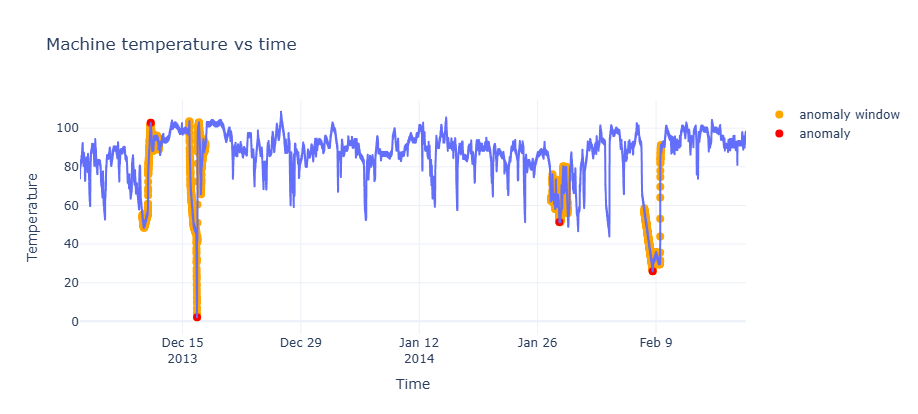

In [11]:
# Visualize line plot - temperature vs time
fig = px.line(df,
        x='time',
        y='value',
        width=1000,
        height=400,
        labels={'time': 'Time', 'value': 'Temperature'},
        template='plotly_white',
        title='Machine temperature vs time')

df_anomaly_points = df[df['anomaly_point'] == 1]
df_anomaly_windows = df[df['anomaly_window'] == 1]

fig.add_trace(go.Scatter(x=df_anomaly_windows['time'],
                         y=df_anomaly_windows['value'],
                         mode='markers',
                         marker=dict(size=8,color='orange',symbol='circle'),
                         name='anomaly window'
                        )
             )

fig.add_trace(go.Scatter(x=df_anomaly_points['time'], 
                         y=df_anomaly_points['value'],
                         mode='markers',
                         marker=dict(size=8,color='red',symbol='circle'),
                         name='anomaly'
                        )
             )


fig.show()

# '''
# This is the matplotlib version for reporting
# plt.figure(figsize=(16, 4.5))
# plt.plot(df['time'], df['value'])
# plt.xlabel('Time')
# plt.ylabel('Temperature')
# plt.xticks(fontsize=8)
# plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=6))
# plt.grid(True)
# plt.title('Machine temperature over time')
# plt.show()
# '''

Visualize anomalies and windows in the plot
- It is obvious to visually know 2nd and 4th as anomaly point; 1st and 3rd are less straightforward
- Window covers points before and after anomalies. Might be a hint of detection

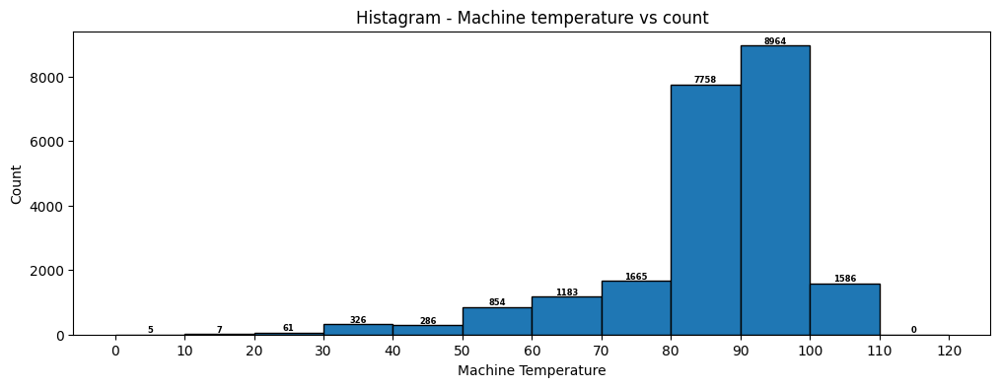

In [12]:
# Histagram
bin_size = range(0, 121, 10)
plt.figure(figsize=(12, 4))
value_count, baredge, bar = plt.hist(df['value'], bins=bin_size, edgecolor='black')

for c, edge, bar_ in zip(value_count, baredge, bar):
    plt.text(
        bar_.get_x() + bar_.get_width() / 2,
        bar_.get_height(),
        int(c),
        ha='center',
        va='bottom',
        fontsize=6,
        fontweight='bold',
        color='black',
    )
plt.xlabel('Machine Temperature')
plt.ylabel('Count')
plt.xticks(bin_size)
plt.title('Histagram - Machine temperature vs count')
plt.show()

In [13]:
fig = px.histogram(df,
                   x='value', 
                   width=1000,
                   height=400,
                   histnorm="probability density",
                   title='Machine Temperature Distribution'
                  )
fig.update_xaxes(tickmode='array',
                 tickvals=list(range(0, 121, 10)),
                )
fig.show()

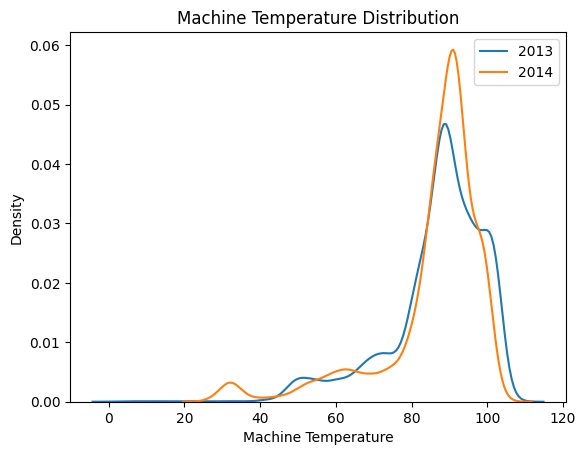

In [14]:
sns.kdeplot(df.loc[df['year']==2013, 'value'], label='2013')
sns.kdeplot(df.loc[df['year']==2014, 'value'], label='2014')

plt.xlabel('Machine Temperature')
plt.legend()
plt.title('Machine Temperature Distribution')
plt.show()

Majority of temperature is around 80~100 degree

### Anomaly Detection

#### Isolation Forest
#### Functions to use
- Value change function (1 --> 0, -1 --> 1)
- Visualization function (plot raw temp vs time, anomaly points, anomaly windows, and flagged anomaly)
- Evaluation function (classification report and confusion matrix)

#### Approach 1 (Isolation Forest trained with whole dataset) 
- [x] Model training with fine tuning
    - For loop for setting choice
- [x] Model prediction
- [x] Evaluation & Visualization
      - Add Anomaly consistency check
- [x] Conclusion

#### Approach 2 (Isolation Forest trained with early phase then test with future) 
- [x] Model training/ fine tuning
    - For loop for setting choice
- [x] Model prediction
- [x] Evaluation & Visualization
      - Add Anomaly consistency check

#### Functions to use

In [31]:
# Define function for visualization
def plot_anomaly_detection_iso(df, consistency_window=None, consistency_check=False):
    fig = go.Figure()

    # Plot raw data
    fig.add_trace(go.Scatter(x=df['time'],
                             y=df['value'],
                             name='Actual Value'))

    # Plot true anomaly window
    df_iso_anomaly_window_true = df[df['anomaly_window'] == 1]
    fig.add_trace(go.Scatter(x=df_iso_anomaly_window_true['time'],
                             y=df_iso_anomaly_window_true['value'],
                             mode='markers',
                             marker=dict(size=4,color='orange',symbol='circle'),
                             name='Anomaly window'))

    # Plot true anomaly point
    df_iso_anomaly_true = df[df['anomaly_point'] == 1]
    fig.add_trace(go.Scatter(x=df_iso_anomaly_true['time'],
                             y=df_iso_anomaly_true['value'],
                             mode='markers',
                             marker=dict(size=4,color='red',symbol='circle'),
                             name='Anomaly point'))

    
    # Plot predicted anomaly only 
    df_iso_anomaly_pred = df[df['Isolation Prediction'] == 1]
    fig.add_trace(go.Scatter(x=df_iso_anomaly_pred['time'],
                             y=df_iso_anomaly_pred['value'],
                             mode='markers',
                             marker=dict(size=4,
                                         color='lime',
                                         # color='rgba(0,0,0,0)',  # Transparent
                                         # symbol='circle',line=dict(color='lime', width=1)
                                        ),
                             name='Predicted Anomaly'))

    # Plot predicted anomaly only with consistency window
    if consistency_check == True:
        df_iso_anomaly_pred_consistent = df[df[f'Consistency result - {consistency_window * 5}mins'] == 1]
        fig.add_trace(go.Scatter(x=df_iso_anomaly_pred_consistent['time'],
                                 y=df_iso_anomaly_pred_consistent['value'],
                                 mode='markers',
                                 marker=dict(size=4,
                                             color='black'
                                             # color='rgba(0,0,0,0)',  # Transparent
                                             # symbol='circle',line=dict(color='black', width=1)
                                            ),
                                 name=f'Predicted Anomaly - Consistent {consistency_window * 5}mins'))    
    
    fig.update_layout(template='simple_white',
                      font=dict(size=14),
                      xaxis_title='Time',
                      yaxis_title='Temperature',
                      width=1200,
                      height=400,
                      title='Isolation Forest - Anomaly detection')
    fig.show()

# Define function for evaluation
def plot_eva(df, consistency_window=None, consistency_check=False):
    if consistency_check == False:
        print(classification_report(df['anomaly_window'], df['Isolation Prediction']))
        conf_matrix_iso = confusion_matrix(df['anomaly_window'], df['Isolation Prediction'])
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix_iso,
                    cmap='Blues',
                    annot=True,
                    fmt='d',
                    linecolor='black',
                    linewidths=0.5,
                    xticklabels=True,
                    yticklabels=True
                   )
    elif consistency_check == True:
        df_iso_anomaly_pred_rolling = df.dropna(subset=[f'Consistency result - {consistency_window * 5}mins'], axis=0)
        df_iso_anomaly_pred_rolling[f'Consistency result - {consistency_window * 5}mins'] = df_iso_anomaly_pred_rolling[f'Consistency result - {consistency_window * 5}mins'].apply(lambda x: 0 if x !=1 else 1 if x == 1 else x)
        print(classification_report(df_iso_anomaly_pred_rolling['anomaly_window'], df_iso_anomaly_pred_rolling[f'Consistency result - {consistency_window * 5}mins']))
        conf_matrix_iso = confusion_matrix(df_iso_anomaly_pred_rolling['anomaly_window'], df_iso_anomaly_pred_rolling[f'Consistency result - {consistency_window * 5}mins'])
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix_iso,
                    cmap='Blues',
                    annot=True,
                    fmt='d',
                    linecolor='black',
                    linewidths=0.5,
                    xticklabels=True,
                    yticklabels=True
                   )
    
    plt.title('Heat map - Isolation Forest')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

# Change normal value from 1 to 0 and anomaly value from -1 to 1
def value_change(x):  
    if x == 1:
        return 0
    elif x == -1:
        return 1

def drop_window_columns(df):
    for column in df.columns:
        if column not in ['timestamp', 'value', 'time', 'year', 'month', 'day', 'hour', 'minute', 'anomaly_point', 'anomaly_window', 'Isolation Prediction']:
            df.drop([column], axis=1, inplace=True)

#### Approach 1 - Training/Prediction
- Train and prediction with the whole dataset
- Setting choice decision (choose setting with the highest F1 score)
  - contamination=0.12
  - n_estimators=300 

In [16]:
df_iso = df.copy()
df_iso.head()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0


In [18]:
# # Setting choice
# contamination_list = [0.05, 0.1, 0.12, 0.15, 0.18, 0.2]
# n_estimators_list = [100, 200, 300, 500]

# # For loop for all possible choices
# for cont in contamination_list:
#     for est in n_estimators_list:
#         model_isolation = IsolationForest(contamination=cont, n_estimators=est, random_state=42)
#         model_isolation.fit(df_iso[['value']])  # Create isolation trees
#         iso_pred = model_isolation.predict(df_iso[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
#         df_iso['Isolation Prediction'] = iso_pred
#         df_iso['Isolation Prediction'] = df_iso['Isolation Prediction'].apply(value_change)

#         print(f'contamination setting: {cont}')
#         print(f'n_estimators setting: {est}')
#         plot_eva(df_iso)
#         plot_anomaly_detection_iso(df_iso)
#         print('\n')

In [17]:
model_isolation = IsolationForest(contamination=0.12, n_estimators=300, random_state=42)
model_isolation.fit(df_iso[['value']])  # Create isolation trees
iso_pred = model_isolation.predict(df_iso[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
df_iso['Isolation Prediction'] = iso_pred
df_iso['Isolation Prediction'] = df_iso['Isolation Prediction'].apply(value_change)
df_iso

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window,Isolation Prediction
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0,0
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0,0
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0,0
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0,0
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,2014,2,19,15,5,0,0,0
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,2014,2,19,15,10,0,0,0
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,2014,2,19,15,15,0,0,0
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,2014,2,19,15,20,0,0,0


#### Approach 1 - Evaluation & Visualization
- Consistency check is used to see whether consistent anomaly occurs (is predicted). This approach is used often in real machine monitoring 
  - If yes, consistency is confirmed, meaning anomaly is ongoing and is not random variation. As a result, flag as real anomaly
  - If no, it is random variation
- Consistency window decision
  - The higher the consistenct window is, the slower the anomaly is flagged
  - The higher the consistenct window is, the higher the false negative is (use ground truth anomaly window). It results in lower recall
  - The higher the consistenct window is, the lower the false positive is (use ground truth anomaly window). It results in higher precision
  - Use 60 mins as consistency window for the following demonstration. Reality is that 60 mins is an accpetable reacting time

In [19]:
# Using rolling mean of the past points as consistency window
windows = [12, 18, 24]  # Use 60, 90, 120 mins for consistency window
for window in windows:
    df_iso[f'Consistency result - {window * 5}mins'] = df_iso['Isolation Prediction'].rolling(window).mean()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window,Isolation Prediction,Consistency result - 60mins,Consistency result - 90mins,Consistency result - 120mins
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0,0,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0,0,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0,0,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0,0,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,2014,2,19,15,5,0,0,0,0.0,0.0,0.0
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,2014,2,19,15,10,0,0,0,0.0,0.0,0.0
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,2014,2,19,15,15,0,0,0,0.0,0.0,0.0
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,2014,2,19,15,20,0,0,0,0.0,0.0,0.0


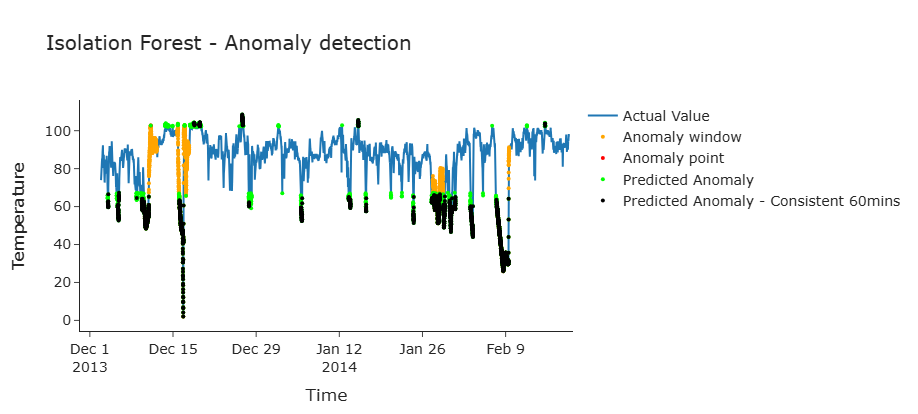

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.95      0.96      0.96     20416
           1       0.62      0.54      0.58      2268

    accuracy                           0.92     22684
   macro avg       0.79      0.75      0.77     22684
weighted avg       0.92      0.92      0.92     22684



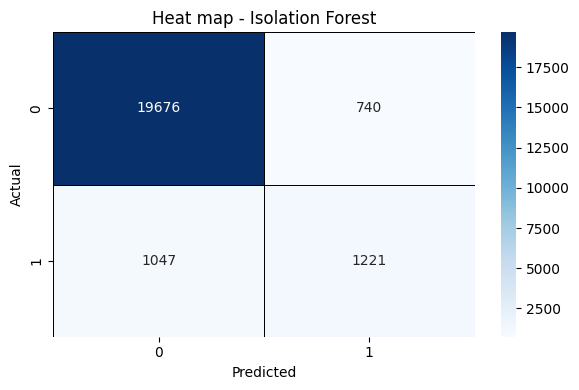

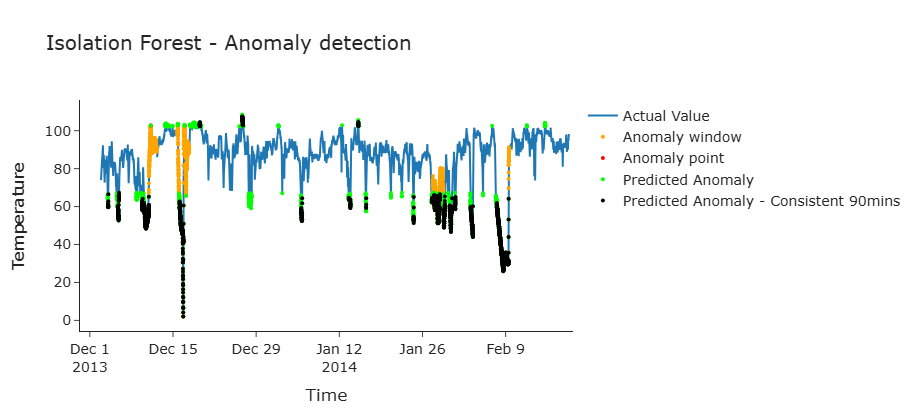

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.95      0.97      0.96     20410
           1       0.66      0.53      0.58      2268

    accuracy                           0.93     22678
   macro avg       0.80      0.75      0.77     22678
weighted avg       0.92      0.93      0.92     22678



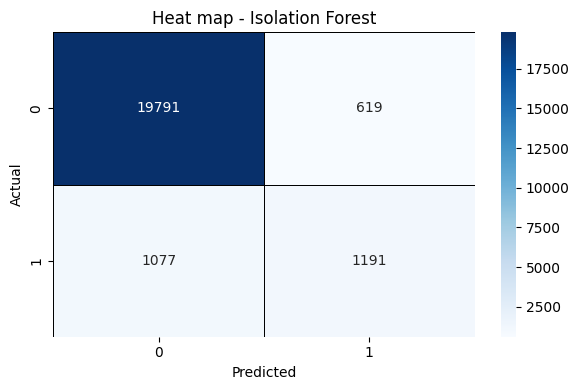

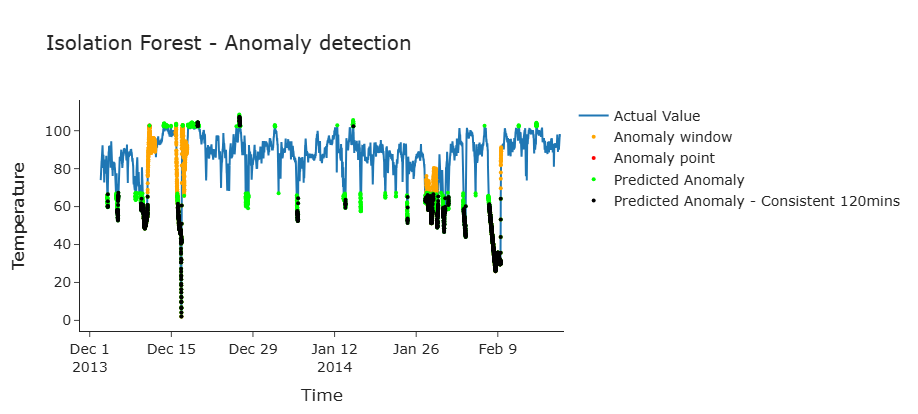

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.95      0.97      0.96     20404
           1       0.69      0.51      0.59      2268

    accuracy                           0.93     22672
   macro avg       0.82      0.74      0.77     22672
weighted avg       0.92      0.93      0.92     22672



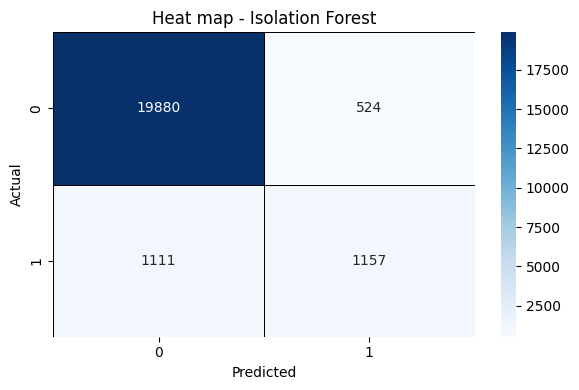

In [20]:
for window in windows:
    plot_anomaly_detection_iso(df_iso, consistency_window=window, consistency_check=True)
    plot_eva(df_iso, consistency_window=window, consistency_check=True)

In [22]:
df_iso.head()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window,Isolation Prediction,Consistency result - 60mins,Consistency result - 90mins,Consistency result - 120mins
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0,0,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0,0,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0,0,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0,0,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0,0,NaN,NaN,NaN


In [23]:
# Remove rolling columns
drop_window_columns(df_iso)
df_iso.head()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window,Isolation Prediction
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0,0
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0,0
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0,0
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0,0
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0,0


#### Approach 1 - Conclusion
- Using isolation forest with contamination=0.12 and n_estimators=300, we achieve highest f1 score as 0.53
- Add consistency check to catch continuous anomaly phenomenon. 60 mins consistency window is chosen as 60 mins reaction time is acceptable in reality
- With 60 mins consistency check, f1 score goes up to 0.58
- Cons of approach 1 is data leakage as we use the whole dataset for training and evaluation. Thus, approach 2 is created

#### Approach 2 - Training/Prediction/Evaluation
- Train/Validation/Test split
  - Training set: 0~60% of data
  - Validation set: 60~80% of data
  - Test set: 80~100% of data
- Setting choice decision (choose setting with the highest f1 score).
  - contamination=0.12
  - n_estimators=100
  - With above setting, train period has the highest f1 score of 0.58 for positive
- Prediction/Evaluation of test set: With the setting above, test period has f1 score of 0.9, meaning isolation forest can pretty much isolate anomalies from test period

#### Approach 2 - Additional condition to reduce false alarm
- Consistency check

##### Train/Validation/Test split

In [41]:
df_iso_2 = df.copy()
split_1 = int(0.6 * df.shape[0])
split_2 = int(0.8 * df.shape[0])
df_iso_2_train = df_iso_2.iloc[:split_1]
df_iso_2_val = df_iso_2.iloc[split_1:split_2]
df_iso_2_train_val = df_iso_2.iloc[:split_2]
df_iso_2_test = df_iso_2.iloc[split_2:]

##### Setting choice decision
- Create tree based on training x
- Validate performance from validation x

In [40]:
# # Setting choice
# contamination_list = [0.05, 0.1, 0.12, 0.15, 0.18, 0.2]
# n_estimators_list = [100, 200, 300, 500]

# # For loop for all possible choices
# for cont in contamination_list:
#     for est in n_estimators_list:
#         model_isolation = IsolationForest(contamination=cont, n_estimators=est, random_state=42)
#         model_isolation.fit(df_iso_2_train[['value']])  # Create isolation trees
#         iso_pred = model_isolation.predict(df_iso_2_val[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
#         df_iso_2_val['Isolation Prediction'] = iso_pred
#         df_iso_2_val['Isolation Prediction'] = df_iso_2_val['Isolation Prediction'].apply(value_change)

#         print(f'contamination setting: {cont}')
#         print(f'n_estimators setting: {est}')
#         plot_eva(df_iso_2_val)
#         plot_anomaly_detection_iso(df_iso_2_val)
#         print('\n')

The best parameter settings: cosider f1 score at negative and positive  
contamination setting: 0.12
n_estimators setting: 100
              precision    recall  f1-score   support

           0       0.98      0.85      0.91      3972
           1       0.44      0.85      0.58       567

    accuracy                           0.85      4539
   macro avg       0.71      0.85      0.74      4539
weighted avg       0.91      0.85      0.87      4539

Model is fine tuned with training and validation set

##### Prediction/Evaluation of test set
- Train isolation forest with training/validation set
- Predict normal/anomaly on test set

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\2618177301.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\2618177301.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3972
           1       0.84      0.96      0.90       567

    accuracy                           0.97      4539
   macro avg       0.92      0.97      0.94      4539
weighted avg       0.97      0.97      0.97      4539



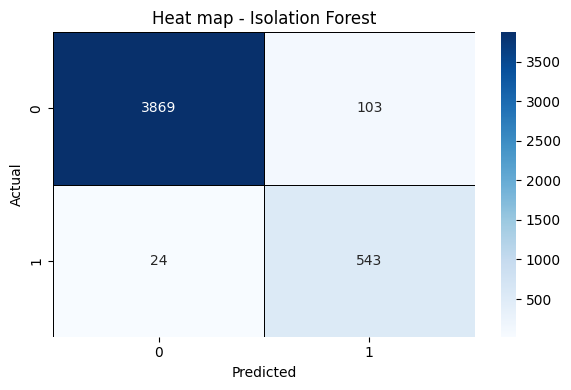

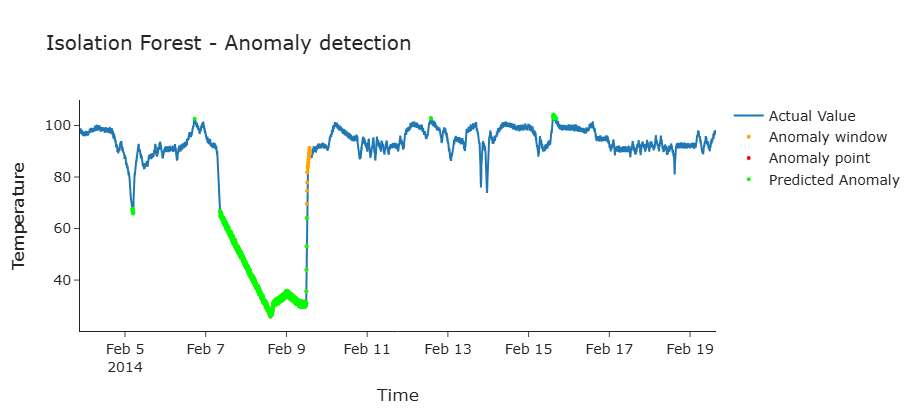

In [42]:
model_isolation_2 = IsolationForest(contamination=0.12, n_estimators=100, random_state=42)

model_isolation_2.fit(df_iso_2_train_val[['value']])  # Create isolation trees
iso_pred_2_test = model_isolation_2.predict(df_iso_2_test[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
df_iso_2_test['Isolation Prediction'] = iso_pred_2_test
df_iso_2_test['Isolation Prediction'] = df_iso_2_test['Isolation Prediction'].apply(value_change)
plot_eva(df_iso_2_test)
plot_anomaly_detection_iso(df_iso_2_test)

Notice a really high f1 score for both negative (0.98) and positive (0.9)  
What about using the trained model on whole dataset?

              precision    recall  f1-score   support

           0       0.95      0.93      0.94     20427
           1       0.49      0.60      0.54      2268

    accuracy                           0.90     22695
   macro avg       0.72      0.77      0.74     22695
weighted avg       0.91      0.90      0.90     22695



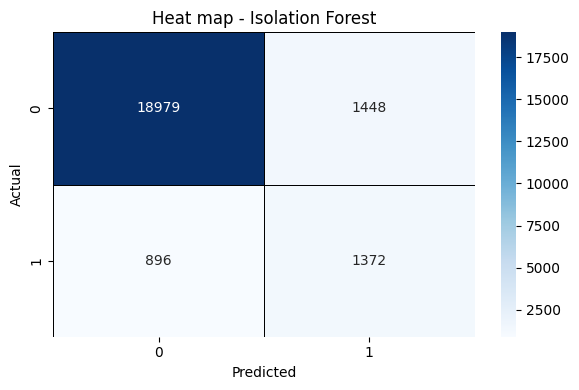

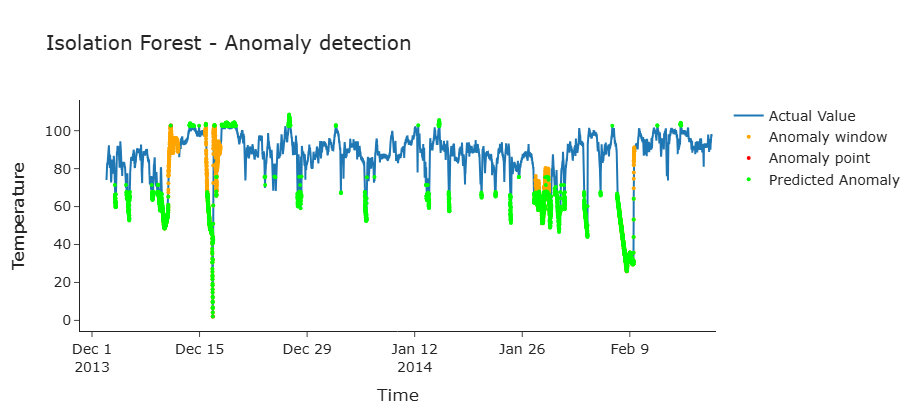

In [44]:
iso_pred_2 = model_isolation_2.predict(df_iso_2[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
df_iso_2['Isolation Prediction'] = iso_pred_2
df_iso_2['Isolation Prediction'] = df_iso_2['Isolation Prediction'].apply(value_change)
plot_eva(df_iso_2)
plot_anomaly_detection_iso(df_iso_2)

f1 score of positive is 0.54. We can see many normal points being flagged as anomalies.  
Let's try to add some condition check to minimize false alarm if case we see this in real life

#### Approach 2 - Additional condition to reduce false alarm (consistency check)
- To eliminate the false alarm from random vairation, consistency window is added to catch continuous anomaly behavior and flag them as anomaly
- Bigger the window is, later the anomaly is flagged --> See from window study
- Let's set 1 hour for the anomaly threshold 
- To test period
  - The higher the consistent window is, the higher the false negative is. It results in lower recall
  - The higher the consistent window is, the lower the false positive is. It results in higher precision
  - f1 score (0.73) is similar for 60/90/120 mins consistency
- To whole period
  - The higher the consistent window is, the higher the false negative is. It results in lower recall
  - The higher the consistent window is, the lower the false positive is. It results in higher precision
  - 120 mins has the highest f1 score of 0.58. However, 60 mins has quite similar f1 score of 0.56. In reality, 60 mins reacting time might be more suitable for better product disposition if any issue

##### Window study

In [48]:
# Using rolling mean of the past points as consistency check
windows = [12, 18, 24]  # Use 60, 90, 120 mins for consistency window
for window in windows:
    df_iso_2_test[f'Consistency result - {window * 5}mins'] = df_iso_2_test['Isolation Prediction'].rolling(window).mean()

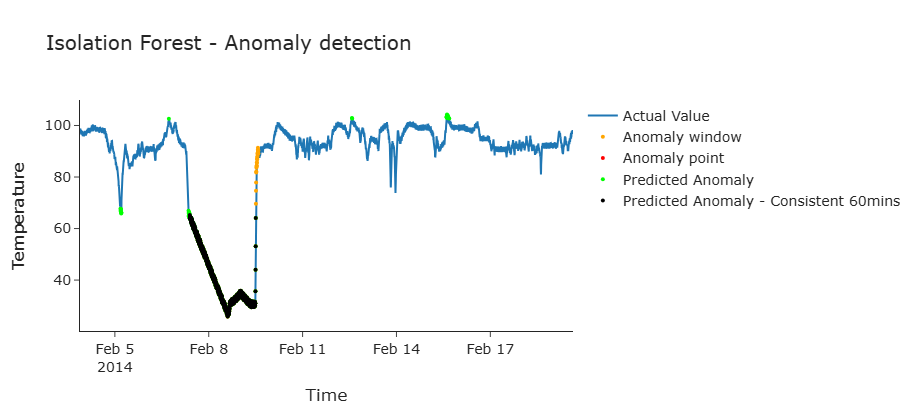

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.99      0.98      0.99      3961
           1       0.89      0.96      0.92       567

    accuracy                           0.98      4528
   macro avg       0.94      0.97      0.96      4528
weighted avg       0.98      0.98      0.98      4528



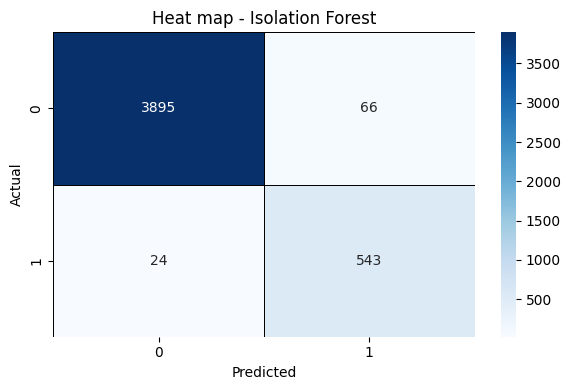

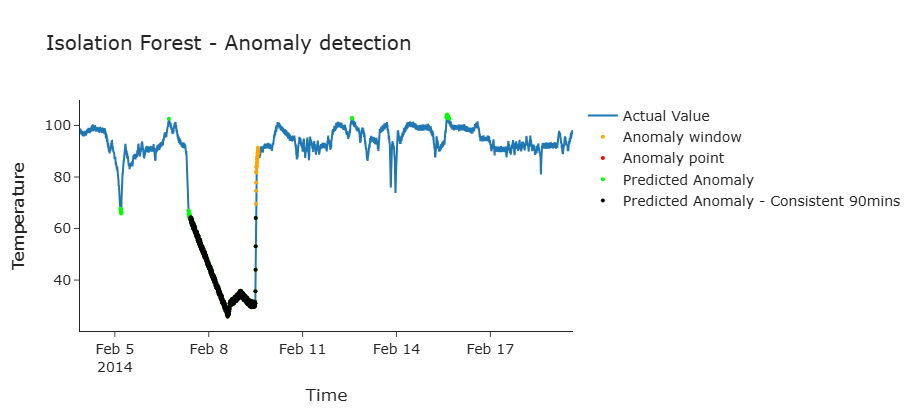

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.99      0.98      0.99      3955
           1       0.90      0.96      0.93       567

    accuracy                           0.98      4522
   macro avg       0.95      0.97      0.96      4522
weighted avg       0.98      0.98      0.98      4522



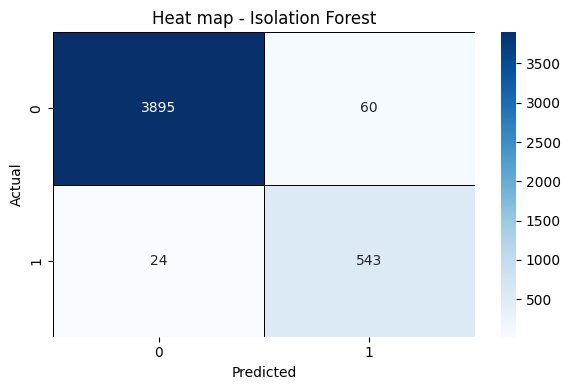

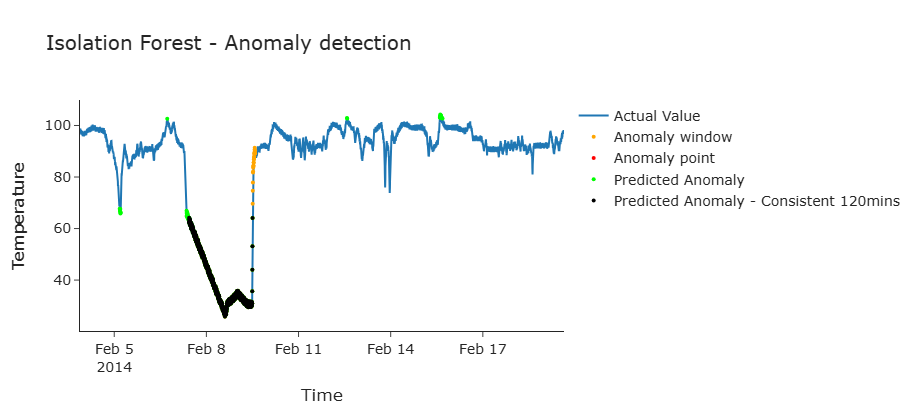

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3949
           1       0.91      0.96      0.93       567

    accuracy                           0.98      4516
   macro avg       0.95      0.97      0.96      4516
weighted avg       0.98      0.98      0.98      4516



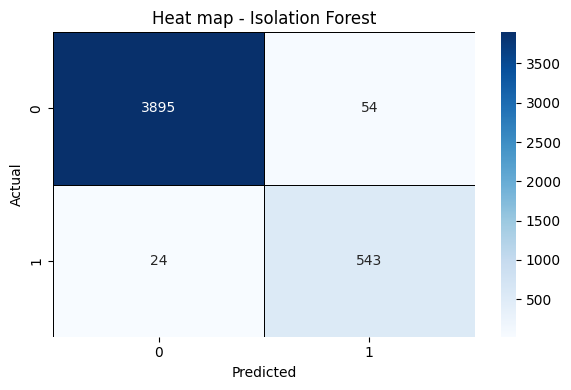

In [53]:
for window in windows:
    plot_anomaly_detection_iso(df_iso_2_test, consistency_window=window, consistency_check=True)
    plot_eva(df_iso_2_test, consistency_window=window, consistency_check=True)

In [24]:
# Remove rolling columns
drop_window_columns(df_iso_2_test)
df_iso_2_test.head()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window,Isolation Prediction
15886,2014-01-27 00:05:00,88.482330,2014-01-27 00:05:00,2014,1,27,0,5,0,0,0
15887,2014-01-27 00:10:00,86.688731,2014-01-27 00:10:00,2014,1,27,0,10,0,0,0
15888,2014-01-27 00:15:00,88.053503,2014-01-27 00:15:00,2014,1,27,0,15,0,0,0
15889,2014-01-27 00:20:00,88.442419,2014-01-27 00:20:00,2014,1,27,0,20,0,0,0
15890,2014-01-27 00:25:00,87.257083,2014-01-27 00:25:00,2014,1,27,0,25,0,0,0


In [51]:
# Using rolling mean of the past points as consistency check
windows = [12, 18, 24]  # Use 60, 90, 120 mins for consistency window
for window in windows:
    df_iso_2[f'Consistency result - {window * 5}mins'] = df_iso_2['Isolation Prediction'].rolling(window).mean()

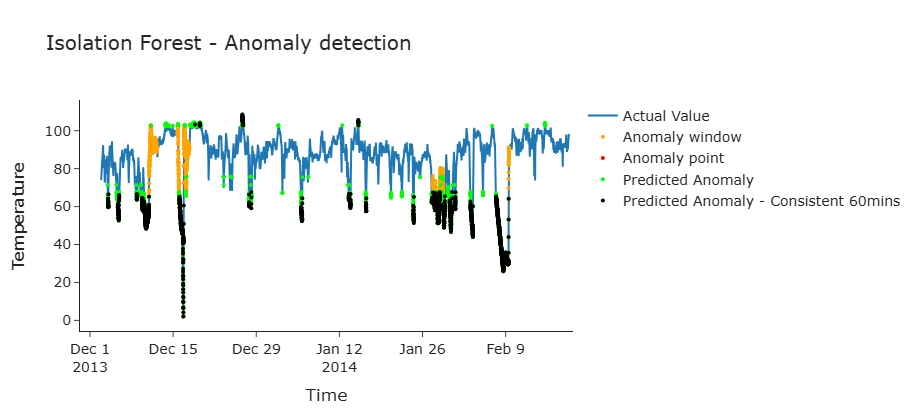

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.95      0.96      0.96     20416
           1       0.62      0.57      0.59      2268

    accuracy                           0.92     22684
   macro avg       0.78      0.76      0.77     22684
weighted avg       0.92      0.92      0.92     22684



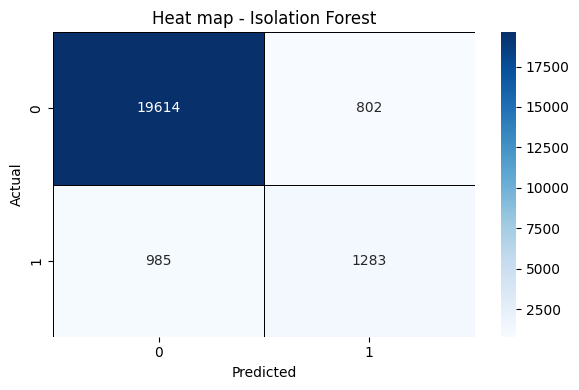

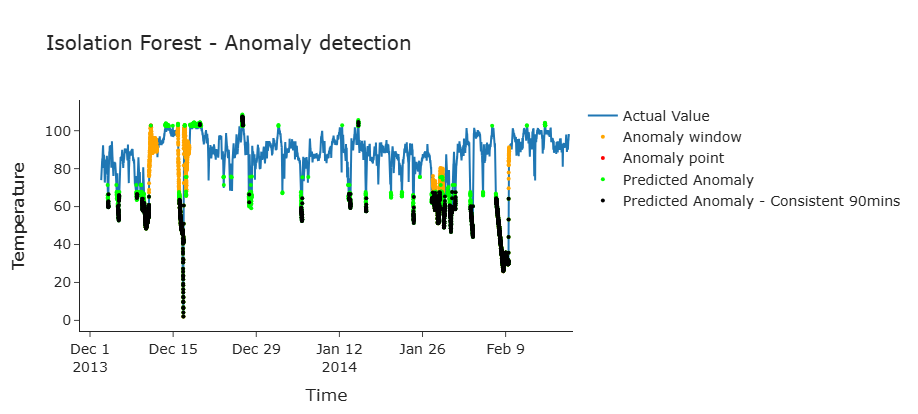

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.95      0.97      0.96     20410
           1       0.65      0.55      0.60      2268

    accuracy                           0.93     22678
   macro avg       0.80      0.76      0.78     22678
weighted avg       0.92      0.93      0.92     22678



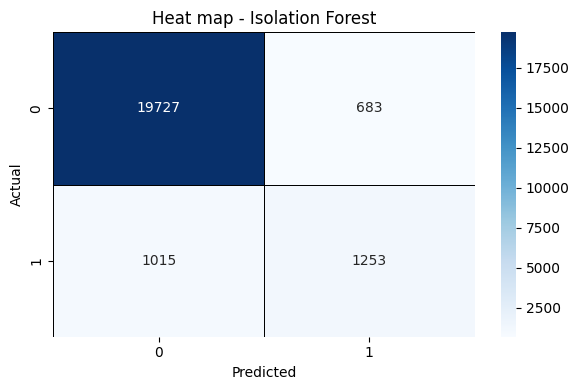

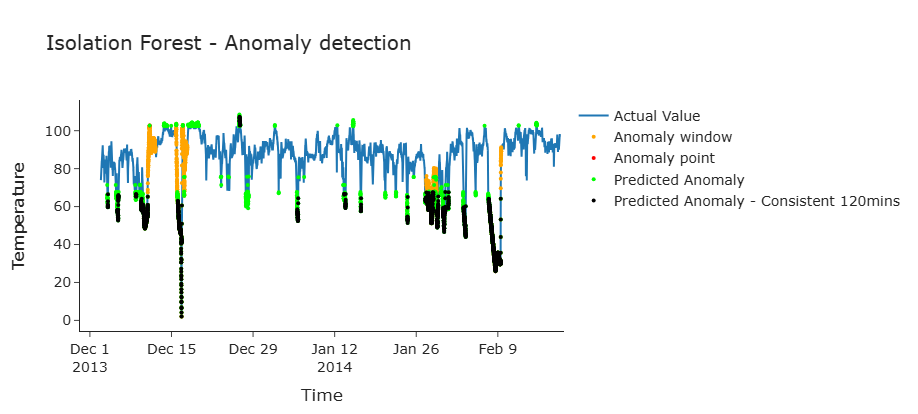

C:\Users\nanya\AppData\Local\Temp\ipykernel_6428\3864189820.py:78: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              precision    recall  f1-score   support

           0       0.95      0.97      0.96     20404
           1       0.68      0.54      0.60      2268

    accuracy                           0.93     22672
   macro avg       0.81      0.75      0.78     22672
weighted avg       0.92      0.93      0.92     22672



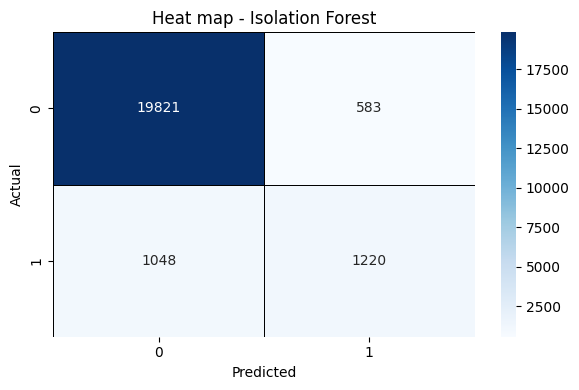

In [52]:
for window in windows:
    plot_anomaly_detection_iso(df_iso_2, consistency_window=window, consistency_check=True)
    plot_eva(df_iso_2, consistency_window=window, consistency_check=True)

#### Approach 2 - Conclusion
- Pick isolation forest with contamination=0.12 and n_estimators=100 based on training and validatino set
- Using contamination=0.12 and n_estimators=100 in isolation forest, we get f1 score of 0.9 in test set and 0.54 in the whole dataset 
- To eliminate the false alarm from random vairation, I add consistency check to catch continuous anomaly phenomenon. 60 mins consistency window is chosen
- With 60 mins consistency check, f1 score goes to 0.92 in test set and f1 score goes up to 0.59 from 0.54 in whole dataset.